<a href="https://colab.research.google.com/github/sayan2001ssg/Dog-vision/blob/master/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end Multiclass Dog breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using id from Kaggel's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The Evaluation is a file with prediction probablities foe each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructed data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set(these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

## Get our workspace ready

* Import TensorFlow 2.x✅
* Import TensorFlow Hub✅
* Make Sure we're using a GPU✅


In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF hub version", hub.__version__)

# Check for GPU availability
print("GPU", "available (Yess!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.3.0
TF hub version 0.9.0
GPU available (Yess!!)


## Getting our data ready (Turning into Tensors)

With all machine learning models, our data has to be in a numerical format. So that's why what we'll be doing first. Turning our images into Tensors (numrical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/My Drive/dog-vision/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     83f0bb565b2186dbcc6a9d009cb26ff2  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


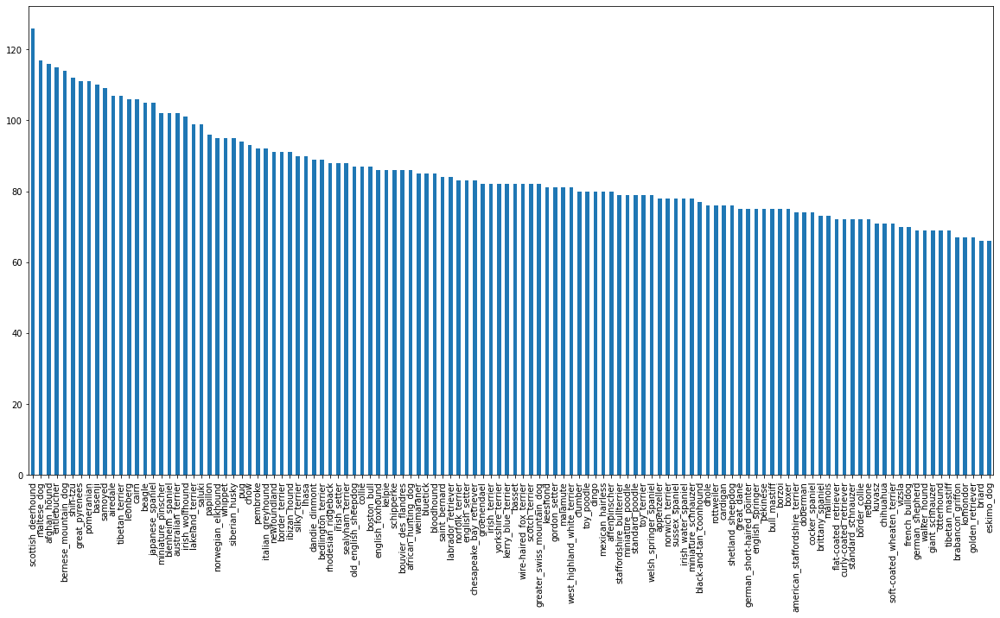

In [ ]:
# How many images are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize= (20, 10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

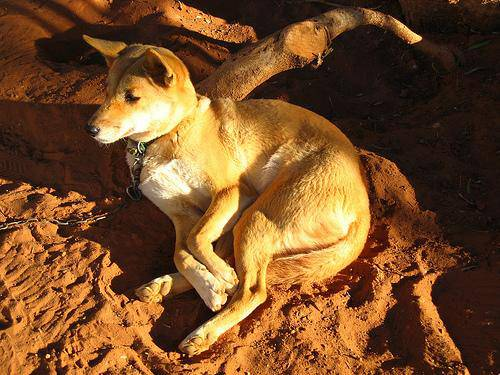

In [ ]:
# let's view an image
from IPython.display import Image
Image("drive/My Drive/dog-vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

lets get a list of all our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ["drive/My Drive/dog-vision/dog-breed-identification/train/"+fname+ ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/My Drive/dog-vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

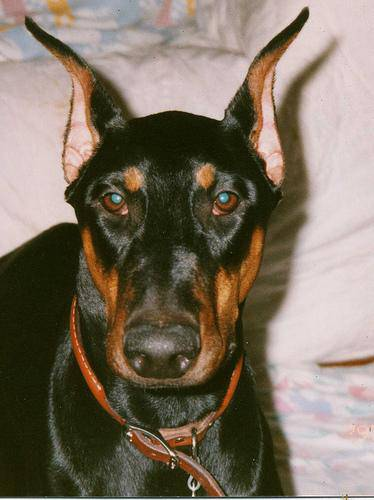

In [ ]:
Image(filenames[9001])

In [ ]:
labels_csv["breed"][9001]

'doberman'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
#labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if the number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("No missing values")
else:
  print("There are missing values")

No missing values


In [ ]:
# find unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# example: Turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds == labels[0])) #index where labels occours
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own validation set

Since the dataset from kaggle doesn't come with a validation set, we are going to create our own.

In [ ]:
# Setup x and y variables
x = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off with ~1000 images and increase as needed.

In [ ]:
# Set number of images used for Expertmenting
NUM_IMAGES = 3000 #@param{type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(2400, 2400, 600, 600)

In [ ]:
# Let's have a geez at the training data
x_train[:5], y_train[:2]

(['drive/My Drive/dog-vision/dog-breed-identification/train/0fb1454104deee316f52244bb2037b37.jpg',
  'drive/My Drive/dog-vision/dog-breed-identification/train/113ef2bb9e14d89f927314f73d573313.jpg',
  'drive/My Drive/dog-vision/dog-breed-identification/train/053106ed091eac5e129225315ef6cfcb.jpg',
  'drive/My Drive/dog-vision/dog-breed-identification/train/2a26dd719f6ab87fc13eb834d9a9f8e6.jpg',
  'drive/My Drive/dog-vision/dog-breed-identification/train/18de05937a44cb467b229889f8a95bcb.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False,  True, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,


## Preprocessing Images (turning images into Tensors)

To preprocess our image into Tensors we are going to write a function which does a few things:

 1. Take an image filepath as an input
 2. Use TensorFlow to read the file and save it to a variable, `image`
 3. Turn our `image` (a jpg) into Tensors
 4. Normalize our image (convert color channel values from 0-255 to 0-1).
 5. Resize the `image` to be a shape of (224,224)
 6. Return the modified `image`

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[100])
image.shape

(500, 500, 3)

In [ ]:
image[:2]

array([[[ 1,  0,  0],
        [26, 25, 23],
        [ 1,  0,  0],
        ...,
        [ 0,  0,  0],
        [10, 10,  8],
        [ 7,  7,  5]],

       [[ 1,  0,  0],
        [11, 10,  8],
        [15, 14, 12],
        ...,
        [15, 15, 13],
        [ 0,  0,  0],
        [ 9,  9,  7]]], dtype=uint8)

In [ ]:
# turn image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[ 1,  0,  0],
        [26, 25, 23],
        [ 1,  0,  0],
        ...,
        [ 0,  0,  0],
        [10, 10,  8],
        [ 7,  7,  5]],

       [[ 1,  0,  0],
        [11, 10,  8],
        [15, 14, 12],
        ...,
        [15, 15, 13],
        [ 0,  0,  0],
        [ 9,  9,  7]]], dtype=uint8)>

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into Tensor.
  """

  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn jpg image into numerical tensors with 3 colour channels (red, green, blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning out Data into batches


In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and assosciated label, 
  processes the image and returns a tuple of (image, label)
  """
  image= process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way to turn our data into tuples of Tensors in the form: `(image, lable)`, let's make a function to turn all of our data (`x` & `y`) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably dont have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # Only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    print("Created...")
    return data_batch

  # If the data is a valid dataset, we dont need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    print("Created...")
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processsor is faster than shuffling images
    data = data.shuffle(buffer_size= len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    print("Created...")
  return data_batch 
              

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data = True) 

Creating training data batches...
Created...
Creating validation data batches...
Created...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in adata batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(20, 10))
  # loop through 25 (or displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn grid lines off
    plt.axis("off")


In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:

train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

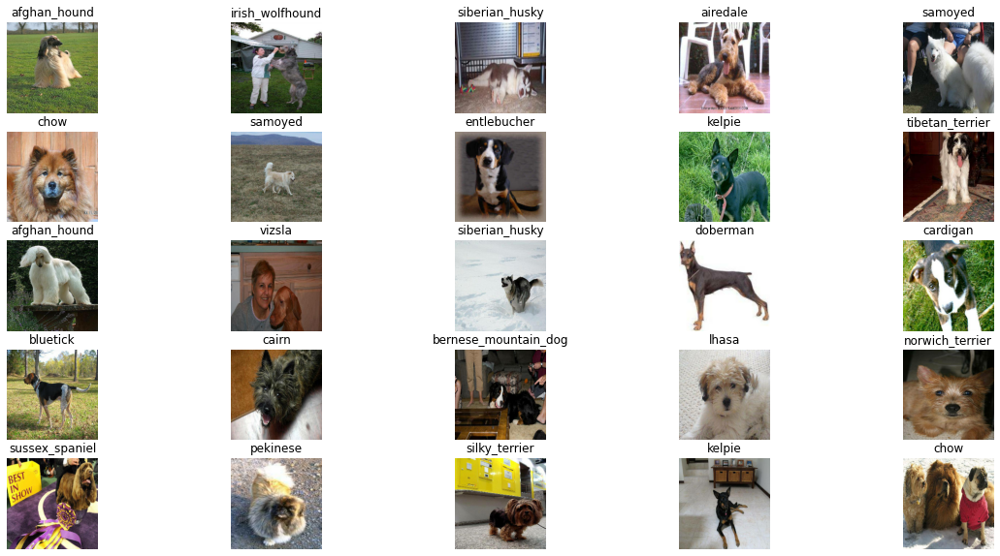

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

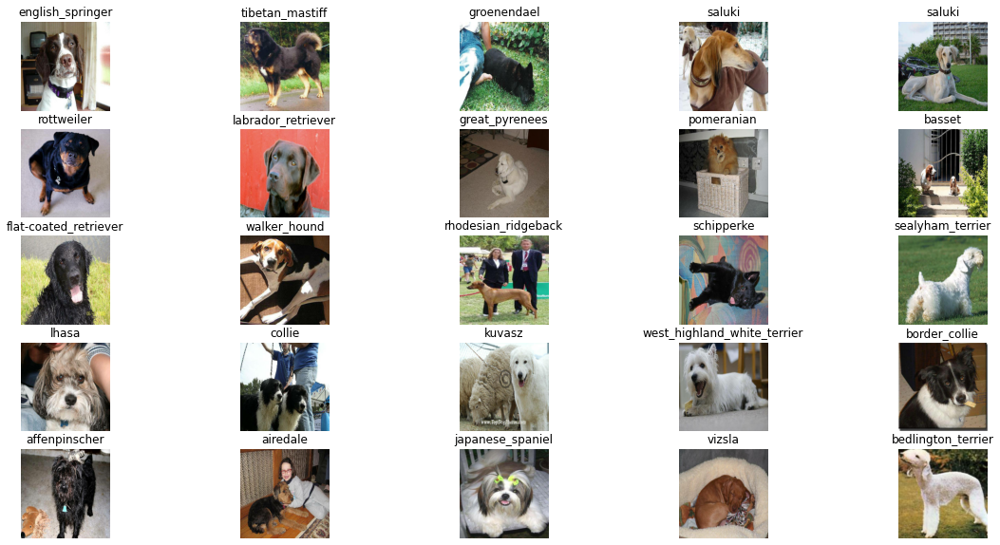

In [ ]:
# Now lets visualize our validate set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define :
* The `input` shape (our images shape, in the form of Tensors) of our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs and outputs and model ready to go. Let's put them together into a Keras deep learning model!

knowing this, let's create a function which:

* Takes the input shape, output shape and the model we have chosen as parameters.
* Defines the Layers in a keras model in sequential fashion(do this first, then this, then that).
* Compiles the model (Says it should be evaluated and improved).
* Builds the model(tells the model the input shape it'll be getting).
* Returns the model.

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # layer2 (output layer)
  ])

  # Compile the Model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the Model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training too long.

### TensorBoard callback

To setup a tensorboard callback, we need to do 3  things:

1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models Training logs with the `% tensorboard` magic function (we'll do this after model training).

In [ ]:
import os

In [ ]:
# Load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for sToring TensorBoard logs
  logdir = os.path.join("drive/My Drive/dog-vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%d%m%Y-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure that the GPU is still running
print("GPU", "available (Yess!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (Yess!!)


Let's create a function which trains a model.
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the fit() function on our model passing it the training data, validation data, No of epochs to train for(`NUM_EPOCHS`) and the callbacks we'd like to use.
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/75 [..............................] - ETA: 0s - loss: 6.1554 - accuracy: 0.0312WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


75/75 [==============================] - 1403s 19s/step - loss: 3.0001 - accuracy: 0.3663 - val_loss: 1.3032 - val_accuracy: 0.7000
Epoch 2/100
75/75 [==============================] - 12s 158ms/step - loss: 0.6077 - accuracy: 0.8687 - val_loss: 0.9066 - val_accuracy: 0.7717
Epoch 3/100
75/75 [==============================] - 12s 158ms/step - loss: 0.2680 - accuracy: 0.9604 - val_loss: 0.8125 - val_accuracy: 0.7733
Epoch 4/100
75/75 [==============================] - 12s 159ms/step - loss: 0.1477 - accuracy: 0.9862 - val_loss: 0.7835 - val_accuracy: 0.7733
Epoch 5/100
75/75 [==============================] - 12s 159ms/step - loss: 0.0957 - accuracy: 0.9958 - val_loss: 0.7597 - val_accuracy: 0.7683
Epoch 6/100
75/75 [==============================] - 12s 158ms/step - loss: 0.0680 - accuracy: 0.9996 - val_loss: 0.7645 - val_accuracy: 0.7650


**Note:** Overfitting to begin with is a good thing! It means our model is learning!

## Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.


In [ ]:
%tensorboard --logdir drive/My\ Drive/dog-vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model.

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

19/19 [==============================] - 2s 120ms/step


array([[2.39950691e-06, 2.16645240e-05, 1.31715706e-06, ...,
        4.37356684e-05, 1.89726434e-05, 2.22756007e-05],
       [1.43905811e-04, 4.94888118e-05, 3.25903529e-05, ...,
        4.21370351e-06, 5.49123943e-05, 1.43701664e-05],
       [1.71961336e-04, 4.68404614e-04, 5.68981850e-05, ...,
        1.19918659e-04, 7.49461251e-05, 4.96814891e-06],
       ...,
       [1.58586458e-03, 3.02052777e-03, 2.08232828e-04, ...,
        2.89391726e-03, 8.99971742e-03, 1.06862855e-04],
       [8.21287267e-06, 6.18927015e-06, 8.87169062e-06, ...,
        8.90502179e-06, 4.11177170e-04, 5.71367855e-06],
       [7.82298957e-06, 8.20616606e-06, 1.51410268e-05, ...,
        1.84272304e-02, 2.96950835e-04, 1.31788678e-04]], dtype=float32)

In [ ]:
# First Prediction
index = 11
print(f"Max value (probablity of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Prediction label: {unique_breeds[np.argmax(predictions[index])]}")

Max value (probablity of prediction): 0.9478275179862976
Sum: 1.000000238418579
Max index: 113
Prediction label: walker_hound


In [ ]:
unique_breeds[113]

'walker_hound'

It would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probablities are also known as confidence levels.

In [ ]:
# Turn prediction probablities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probablities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probablities
pred_label = get_pred_label(predictions[111])
pred_label

'keeshond'

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation  images and then compare those predictions to the validation label (truth labels).

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a function to unbatch a dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays
  of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.41326207, 0.41718364, 0.3544385 ],
         [0.36937293, 0.3732945 , 0.31054938],
         [0.38238448, 0.38630605, 0.32356092],
         ...,
         [0.85572916, 0.8988664 , 0.9216594 ],
         [0.81720906, 0.8603463 , 0.8760326 ],
         [0.87009096, 0.9132282 , 0.9289145 ]],
 
        [[0.41238695, 0.41630852, 0.3535634 ],
         [0.40000004, 0.4039216 , 0.34117648],
         [0.40333864, 0.4072602 , 0.3445151 ],
         ...,
         [0.96608555, 0.9984034 , 0.9996638 ],
         [0.937802  , 0.98093927, 0.99544823],
         [0.9232422 , 0.95921254, 0.96534306]],
 
        [[0.41683942, 0.420761  , 0.35801587],
         [0.39275387, 0.39667544, 0.3339303 ],
         [0.4052726 , 0.40919417, 0.34644905],
         ...,
         [0.93628675, 0.9760188 , 0.98673296],
         [0.788624  , 0.8290739 , 0.8393855 ],
         [0.8861353 , 0.92658526, 0.93689686]],
 
        ...,
 
        [[0.3655635 , 0.25968117, 0.2322302 ],
         [0.38517138, 0.279289  , 0.25183

Now we have got ways to get :
* Predicted labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probablities, an array of truth labels and an array of images and an integers.
* Convert the prediction probablities to a predicted label.
* Plot the predicted label, its predicted probablity, the truth label and the target image on a single plot 

In [ ]:
def plot_pred(prediction_probablities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probablities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the plot
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

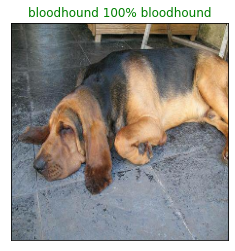

In [ ]:
plot_pred(prediction_probablities = predictions,
          labels=val_labels,
          images=val_images,
          n=42)

Now we have got one function to visualize our models top predection, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probablities array and a good truth array and an integer
* Find the prediction using `get_pred_label()` 
* Find the top 10:
   * Prediction probablities indexes
   * Prediction probablities values
   * Prediction labels

*  Plot the top 10 prediction probablity values and labels, coloring the true label green 

In [ ]:
 def plot_pred_conf (prediction_probabilities, labels, n=1):
   """
   Plus the top 10 highest pediction confidence along with the truth label for sample n.
   """
   pred_prob, true_label = prediction_probabilities[n], labels[n]

   # Get the highest predicted label
   pred_label = get_pred_label(pred_prob)

   # Find the top 10 prediction confidence indexes
   top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
   # Find the top 10 prediction confidence values
   top_10_pred_values = pred_prob[top_10_pred_indexes]
   # Find top 10 prediction labels
   top_10_pred_labels = unique_breeds[top_10_pred_indexes]

   # Setup plot
   top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                      top_10_pred_values,
                      color = 'grey')
   plt.xticks(np.arange(len(top_10_pred_labels)),
              labels = top_10_pred_labels,
              rotation = "vertical")
   
   # Change the colour of true label
   if np.isin(true_label, top_10_pred_labels):
     top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
   else:
     pass 

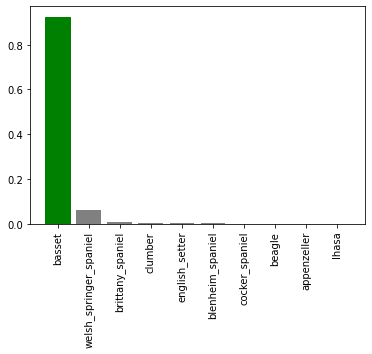

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n=9)

Now we have got some function to help us visualize our predictions and evaluate our model.

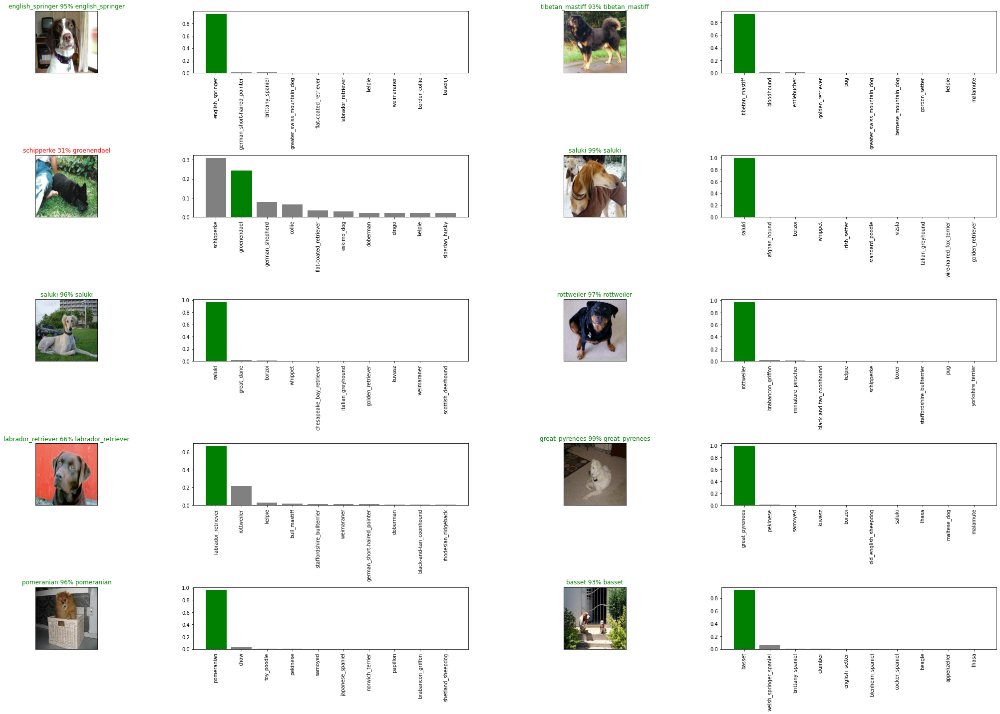

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 5
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(15*num_cols, 10*num_cols))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probablities= predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and Reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/dog-vision/models",
                          datetime.datetime.now().strftime("%d%m%Y-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #save format of model
  print(f"Saving model to: { model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer":hub.KerasLayer})
  return model 

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images")

Saving model to: drive/My Drive/dog-vision/models/28082020-15201598628053-1000-images.h5...


'drive/My Drive/dog-vision/models/28082020-15201598628053-1000-images.h5'

In [ ]:
# Load a trained 
load_1000_model = load_model('drive/My Drive/dog-vision/models/28082020-11431598615039-1000-images.h5')

Loading saved model from: drive/My Drive/dog-vision/models/28082020-11431598615039-1000-images.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

19/19 [==============================] - 2s 101ms/step - loss: 0.7645 - accuracy: 0.7650


[0.7645113468170166, 0.7649999856948853]

In [ ]:
# Evatuate loaded model
load_1000_model.evaluate(val_data)

19/19 [==============================] - 2s 100ms/step - loss: 0.7301 - accuracy: 0.7883


[0.7300813794136047, 0.7883333563804626]

## Training a big dog model (on full scale)

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(x,y)

Creating training data batches...
Created...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

**Note:** Running the cell below will take some while.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3575s 11s/step - loss: 1.3421 - accuracy: 0.6710
Epoch 2/100
320/320 [==============================] - 39s 121ms/step - loss: 0.3949 - accuracy: 0.8854
Epoch 3/100
320/320 [==============================] - 39s 122ms/step - loss: 0.2390 - accuracy: 0.9352
Epoch 4/100
320/320 [==============================] - 39s 122ms/step - loss: 0.1567 - accuracy: 0.9605
Epoch 5/100
320/320 [==============================] - 39s 121ms/step - loss: 0.1081 - accuracy: 0.9772
Epoch 6/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0784 - accuracy: 0.9870
Epoch 7/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0603 - accuracy: 0.9904
Epoch 8/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0459 - accuracy: 0.9939
Epoch 9/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0379 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 40s 124m

In [ ]:
save_model(full_model, suffix= "full-image-model-1")

Saving model to: drive/My Drive/dog-vision/models/28082020-16341598632452-full-image-model-1.h5...


'drive/My Drive/dog-vision/models/28082020-16341598632452-full-image-model-1.h5'

In [ ]:
# Load full model
loaded_full_model = load_model('drive/My Drive/dog-vision/models/28082020-16341598632452-full-image-model-1.h5')

Loading saved model from: drive/My Drive/dog-vision/models/28082020-16341598632452-full-image-model-1.h5


## Making prediction in dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into same format.

Luckily we have created `create_data_batches()` earlier which can take a list of filenames as input and convert them into tensor batches.

* Get the test image filenames.
* Convert the filenames into test data batches using `create_date_batches()` and setting the `test_data()` and setting the 'test_data' parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/dog-vision/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/dog-vision/dog-breed-identification/test/ed3f78bd3eb6751819212fa111857e51.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/test/e96fd30110107e506de94d81af346238.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/test/f10c58048410333d9c4156046b0ea54f.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/test/f062edd0025c4ecad1a34125ee6a761a.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/test/eee7c863af47e22f285f8aeb80adb4b9.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/test/f0eb0e073867e9a31cc5222c225ad142.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/test/ef510b25dc13743d566b719b41b35e92.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/test/ef9432cc6dc7ab7ba38d18abffe6d1a0.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/test/f01df7641b237cd177d71fdb8db9bd58.jpg',
 'drive/My Drive/dog-vision/dog-breed-identification/test/f1f42942df460f38181e12ebce695b5e.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...
Created...


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run. [About an ~hr] 

In [ ]:
# Make predictions on the test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 4707s 15s/step


In [ ]:
# Save prediction (Numpy array) to csv fie (for access later)
np.savetxt("drive/My Drive/dog-vision/preds_array.csv", test_predictions, delimiter=',')

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/dog-vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.13151936e-11, 1.57624687e-08, 6.53452878e-13, ...,
        1.56344339e-12, 1.19539448e-10, 8.49162841e-12],
       [4.90593156e-12, 5.48408333e-11, 9.99997020e-01, ...,
        2.22402008e-09, 3.52283758e-11, 3.61794032e-11],
       [1.52721025e-09, 1.65423975e-09, 2.02483655e-11, ...,
        4.48930060e-10, 6.94118651e-10, 6.30564545e-10],
       ...,
       [9.99663115e-01, 2.71531384e-08, 2.51542992e-12, ...,
        3.78796855e-11, 4.55322195e-12, 1.64376388e-08],
       [1.49016355e-09, 1.81151857e-10, 4.04634469e-13, ...,
        1.62516615e-11, 3.06712934e-07, 6.32298337e-12],
       [3.49336986e-08, 9.04235797e-09, 7.31832550e-09, ...,
        4.40536319e-09, 3.15307407e-05, 3.21317088e-06]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset 

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the image ID's from their filepaths.
* Add data (the prediction probablities) to each of the dog breed columns.
* Export the DataFrame as a CSV and submit to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrme
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ed3f78bd3eb6751819212fa111857e51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e96fd30110107e506de94d81af346238,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,f10c58048410333d9c4156046b0ea54f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f062edd0025c4ecad1a34125ee6a761a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,eee7c863af47e22f285f8aeb80adb4b9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ed3f78bd3eb6751819212fa111857e51,1.13152e-11,1.57625e-08,6.53453e-13,5.00661e-13,4.08806e-14,3.00082e-13,6.49225e-10,4.77051e-14,1.38281e-12,3.24574e-14,2.55e-13,1.07701e-13,3.6296e-10,9.44983e-09,2.45004e-08,4.96131e-13,1.31265e-12,1.93123e-12,3.50869e-11,7.19592e-14,3.37174e-13,6.36476e-13,7.38605e-11,1.76374e-12,1.47347e-09,1.52411e-13,1.07274e-13,7.45622e-14,2.70417e-11,5.10281e-14,1.20511e-10,6.45233e-12,1.52928e-08,1.12325e-12,7.56077e-12,1.36321e-13,1.49363e-09,7.4634e-14,1.54806e-10,...,2.12553e-13,2.4665e-12,3.13483e-11,2.10976e-10,5.80801e-10,1.12207e-11,2.34028e-12,7.35852e-10,6.23354e-13,6.60955e-08,3.1464e-13,5.23223e-13,1.90692e-13,7.92384e-10,1.97653e-14,5.09268e-13,1.66015e-10,2.78914e-11,1.83283e-12,1.21741e-12,2.46433e-13,9.86468e-14,1.40666e-10,2.70752e-11,3.56945e-12,3.26299e-12,2.20718e-09,7.61999e-09,4.42958e-13,8.87724e-14,2.95767e-11,7.40063e-14,6.02386e-11,1.95569e-11,3.19446e-13,1.95663e-08,2.77898e-13,1.56344e-12,1.19539e-10,8.49163e-12
1,e96fd30110107e506de94d81af346238,4.90593e-12,5.48408e-11,0.999997,4.76893e-11,4.21919e-10,1.70986e-12,3.13541e-10,2.74535e-11,3.35414e-12,2.5448e-13,2.46345e-11,1.24756e-11,2.55601e-10,3.38615e-12,1.65009e-10,5.23446e-10,9.57562e-12,9.56002e-09,9.564e-11,2.80871e-12,6.89678e-10,7.52238e-11,1.25792e-10,9.06066e-08,2.88687e-11,4.47316e-13,1.04438e-07,4.9678e-09,1.16118e-11,3.7433e-10,7.8569e-12,1.76075e-10,7.98264e-11,2.44019e-10,1.7416e-08,9.71495e-10,7.70509e-07,3.43754e-08,3.48559e-13,...,1.18888e-08,2.30198e-10,3.54567e-12,4.16126e-10,4.48839e-11,3.5412e-12,5.76285e-12,7.19307e-12,1.45977e-11,1.17561e-11,6.27887e-08,4.90689e-11,1.80036e-13,3.22247e-11,1.08156e-12,9.14839e-11,2.92938e-09,1.04929e-10,9.29902e-10,1.11051e-09,8.5415e-11,4.61184e-08,1.09412e-08,1.72319e-10,3.99667e-07,1.26634e-12,1.60432e-11,3.59511e-13,4.43993e-10,2.42004e-07,1.08836e-09,2.15242e-11,1.44309e-11,6.46924e-12,2.24934e-09,7.80936e-12,7.5669e-11,2.22402e-09,3.52284e-11,3.61794e-11
2,f10c58048410333d9c4156046b0ea54f,1.52721e-09,1.65424e-09,2.02484e-11,0.000151007,6.37265e-08,0.000306812,0.000234135,9.77029e-10,2.28465e-10,1.415e-09,3.59238e-10,5.34282e-07,0.000179277,3.83695e-10,5.37608e-08,1.9722e-09,7.59534e-11,8.26274e-10,1.7085e-11,8.4349e-11,1.55478e-11,8.91578e-08,5.27378e-07,1.11393e-10,2.62595e-10,2.13983e-08,4.1315e-14,2.04988e-13,1.07093e-07,1.60783e-09,7.50732e-08,7.69886e-10,5.75248e-10,3.49334e-12,1.89245e-08,4.17239e-09,8.32577e-09,2.45331e-11,0.000124311,...,4.99789e-08,2.02105e-08,1.31042e-11,7.50444e-09,2.68953e-08,4.84125e-08,2.3192e-09,3.23807e-08,5.217e-09,7.82924e-07,3.60381e-07,0.965435,1.12355e-10,6.92678e-12,6.5755e-09,1.92207e-08,8.61937e-10,4.57942e-10,7.93548e-10,8.53714e-10,4.20422e-12,4.32279e-11,1.51949e-07,1.5729e-10,2.13689e-07,9.25469e-11,3.09421e-09,1.98463e-10,1.16953e-05,1.67403e-11,1.10837e-08,8.77853e-06,2.64056e-07,2.96312e-08,5.76244e-08,2.23265e-08,3.397e-09,4.

In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/dog-vision/full_model_submission.csv",
                index=False)

## Making prediction on custom images

To make predictions on custom images, we'll:
* Get the Filepath into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `tese_data` parameter to `True`.
* Pass the custom image data Batch to our model's `predict()` method.
* Convert the prediction output Probablities to Prediction labels.
* Compare the Predicted labels to the custom images. 

In [ ]:
# Get custom image filepaths
#custom_path = ""
#custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
#custom_image_paths

In [ ]:
# Make predictions on the custom data
#custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
# Get custom image prediction labels
#custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
#custom_pred_labels

In [ ]:
#custom_images = []
# Loop thruogh unbatched data
#for image in custom_data.unbatch().as_numpy_iterator():
#  custom_images.append(image)

In [ ]:
# Check custom image predictions
# plt.figure(figsize=(10, 10))
# for i , image in enumerate(custom_images):
#   plt.subplot(1, 3, i+1)
#   plt.xticks([])
#   plt.yticks([])
#   plt.title(custom_pred_labels[i])
#   plt.imshow(image)